#### Używane pakiety


In [45]:
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt

#### Wyliczenie obrazu

In [46]:
# wyliczenie obrazka
list_of_images = os.listdir("color")
number = 325211%36
name = list_of_images[number]
print("Nazwa obrazu :", name, "\nNumer obrazu: ", number)

Nazwa obrazu : mobile_col.png 
Numer obrazu:  23


#### Użyte obrazy

In [47]:
# path do obrazków
png_name = "mobile"

color = "color/" + png_name + "_col.png"
mono = "monochrome/" + png_name + "_mono.png"

#### Przydatne funkcje

In [86]:
# funckja ładuje obraz i konwertuje go to formatu RGB (domyślnie jest w BGR)
def load_img(path_to_file):
    img = cv2.imread(path_to_file, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    return img


def load_mono_img(path_to_file):
    img = cv2.imread(path_to_file, cv2.IMREAD_GRAYSCALE)

    return img

# funckja do wyświetlania obrazu
def plt_imshow(img, img_title="image"):
    if img.dtype == np.int32:
        img = (img + 255) // 2

    plt.figure()
    plt.title(img_title)
    plt.imshow(img, cmap="gray", vmin=0, vmax=255)
    plt.xticks([]), plt.yticks([])
    plt.show()

# Obraz monochromatyczny

#### Liczenie Entropii obrazu monochromatycznego

In [70]:
# funckja do liczenia entropi ,przyjmuje histogram
def calc_entropy(hist):

    pdf = hist/hist.sum()
    entropy = -sum([x*np.log2(x) for x in pdf if x != 0])
    return entropy

# funckja do liczenia histogramu obrazu monohromatycznego
def calc_hist(img):
    hist = cv2.calcHist([img], [0], None, [256], [0, 256])
    return hist

mono_hist = calc_hist(load_mono_img(mono))
color_hist = calc_hist(load_img(color))

mono_entropy = calc_entropy(mono_hist)
color_entropy = calc_entropy(color_hist)

print("Entropia obrazu monochromatycznego: ", mono_entropy)
print("Entropia obrazu kolorowego: ", color_entropy)

Entropia obrazu monochromatycznego:  [7.1105666]
Entropia obrazu kolorowego:  [7.0788207]


#### Wyznaczenie obrazu różnicowego

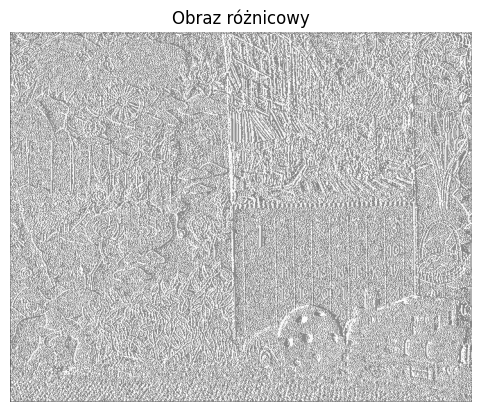

In [73]:
# Wczytanie obrazu monochromatycznego
mono_img = cv2.imread(mono, cv2.IMREAD_GRAYSCALE)

# Obliczenie różnicy pikseli w poziomie
image_hdiff = np.diff(mono_img, axis=1)

# Obliczenie różnicy dla pierwszego piksela o 127
first_pixel_diff = mono_img[:, 0].astype(np.int16) - 127

# Połączenie różnic
mono_hdiff = np.hstack((first_pixel_diff[:, np.newaxis], image_hdiff))

# Wyświetlenie obrazu
plt.imshow(mono_hdiff, cmap='gray', vmin=-255, vmax=255)
plt.axis('off')
plt.title("Obraz różnicowy")
plt.show()

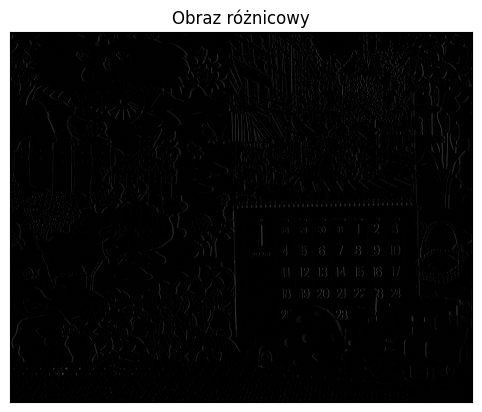

In [83]:

mono_img = load_mono_img(mono)


# wybieramy wszystkie piksele oprócz ostatniego
img_tmp1 = mono_img[:, 1:]

# wybieramy wszystkie piksele oprócz pierwszego
img_tmp2 = mono_img[:, :-1]

# różnica pomiędzy pikselem a pikselem o jeden w lewo
image_hdiff = cv2.addWeighted(img_tmp1, 1, img_tmp2, -1, 0, dtype=cv2.CV_16S)

# różnica dla pierwszego piksela o 127
image_hdiff_0 = cv2.addWeighted(image[:, 0], 1, 0, 0, -127, dtype=cv2.CV_16S)

# połączenie tych różnic
mono_hdiff = np.hstack((image_hdiff_0, image_hdiff))

# wyświetlenie obrazu
plt_imshow(mono_hdiff, "Obraz różnicowy")



#### Histogram obrazu różnicowego

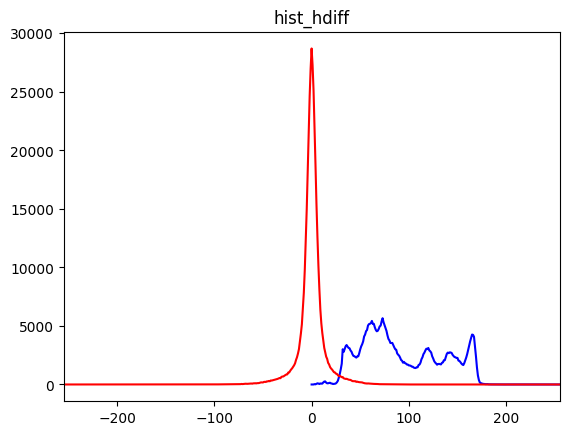

In [87]:
image_tmp = (mono_hdiff+255).astype(np.uint16)
hist_hdiff = cv2.calcHist([image_tmp], [0], None, [511], [0, 511]).flatten()


plt.figure()
plt.plot(mono_hist, color="blue")
plt.title("hist_image")
plt.xlim([0, 255])
plt.plot(np.arange(-255, 256, 1), hist_hdiff, color="red")
plt.title("hist_hdiff")
plt.xlim([-255, 255])
plt.show()

####  Entropia różnicowego

In [ ]:
# entropia obrazu różnicowego
diff_entropy = calc_entropy(hist_hdiff)

print("Entropia obrazu różnicowego: ", diff_entropy)
print("Entropia obrazu: ", org_entropy)

Entropia obrazu różnicowego:  5.352280771687219
Entropia obrazu:  7.078820897222613


#### Transfromacja falkowa

LL, wymiary: (288, 360), typ danych: uint8, wartości: 5 - 225
LH, wymiary: (288, 360), typ danych: int16, wartości: -115 - 111
HL, wymiary: (288, 360), typ danych: int16, wartości: -96 - 81
HH, wymiary: (288, 360), typ danych: int16, wartości: -72 - 73


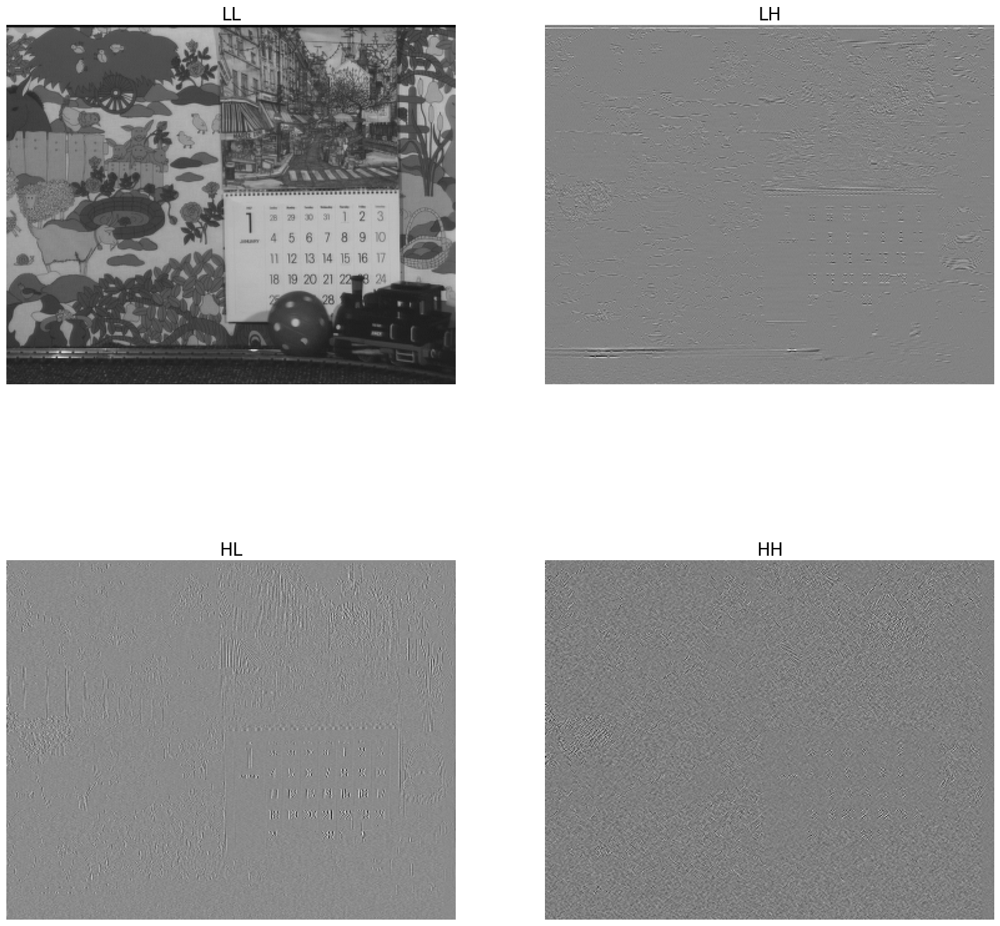

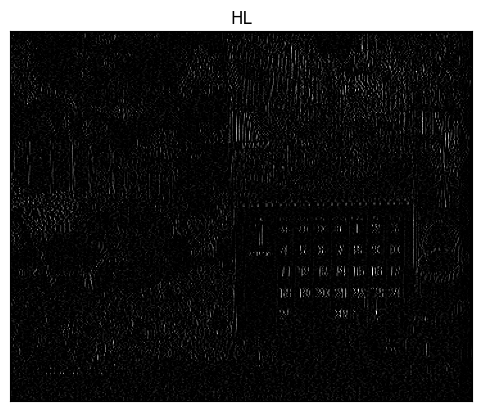

In [88]:
def printi(img, img_title="image"):
    """ Pomocnicza funkcja do wypisania informacji o obrazie. """
    print(f"{img_title}, wymiary: {img.shape}, typ danych: {img.dtype}, wartości: {img.min()} - {img.max()}")

def dwt(img):

    maskL = np.array([0.02674875741080976, -0.01686411844287795, -0.07822326652898785, 0.2668641184428723,
        0.6029490182363579, 0.2668641184428723, -0.07822326652898785, -0.01686411844287795, 0.02674875741080976])
    maskH = np.array([0.09127176311424948, -0.05754352622849957, -0.5912717631142470, 1.115087052456994,
        -0.5912717631142470, -0.05754352622849957, 0.09127176311424948])

    bandLL = cv2.sepFilter2D(img,         -1, maskL, maskL)[::2, ::2]
    bandLH = cv2.sepFilter2D(img, cv2.CV_16S, maskL, maskH)[::2, ::2] ### ze względu na filtrację górnoprzepustową -> wartości ujemne, dlatego wynik 16-bitowy ze znakiem
    bandHL = cv2.sepFilter2D(img, cv2.CV_16S, maskH, maskL)[::2, ::2]
    bandHH = cv2.sepFilter2D(img, cv2.CV_16S, maskH, maskH)[::2, ::2]

    return bandLL, bandLH, bandHL, bandHH


image = cv2.imread(mono, cv2.IMREAD_GRAYSCALE)

ll, lh, hl, hh = dwt(image)


printi(ll, "LL")
printi(lh, "LH")
printi(hl, "HL")
printi(hh, "HH")

# w celu poprawienia widoczności, zwiększamy kontrast obrazów 'H'
lh = cv2.multiply(lh, 4)
hl = cv2.multiply(hl, 4)
hh = cv2.multiply(hh, 4)

fig, axs = plt.subplots(2, 2, figsize=(20, 20))
for ax in axs.flat:
    ax.axis("off")

axs[0, 0].imshow(ll, cmap="gray")
axs[0, 0].set_title("LL", fontsize=20)
axs[0, 1].imshow(lh, cmap="gray")
axs[0, 1].set_title("LH", fontsize=20)
axs[1, 0].imshow(hl, cmap="gray")
axs[1, 0].set_title("HL", fontsize=20)
axs[1, 1].imshow(hh, cmap="gray")
axs[1, 1].set_title("HH", fontsize=20)
plt.show()

plt_imshow(hl, "HL")


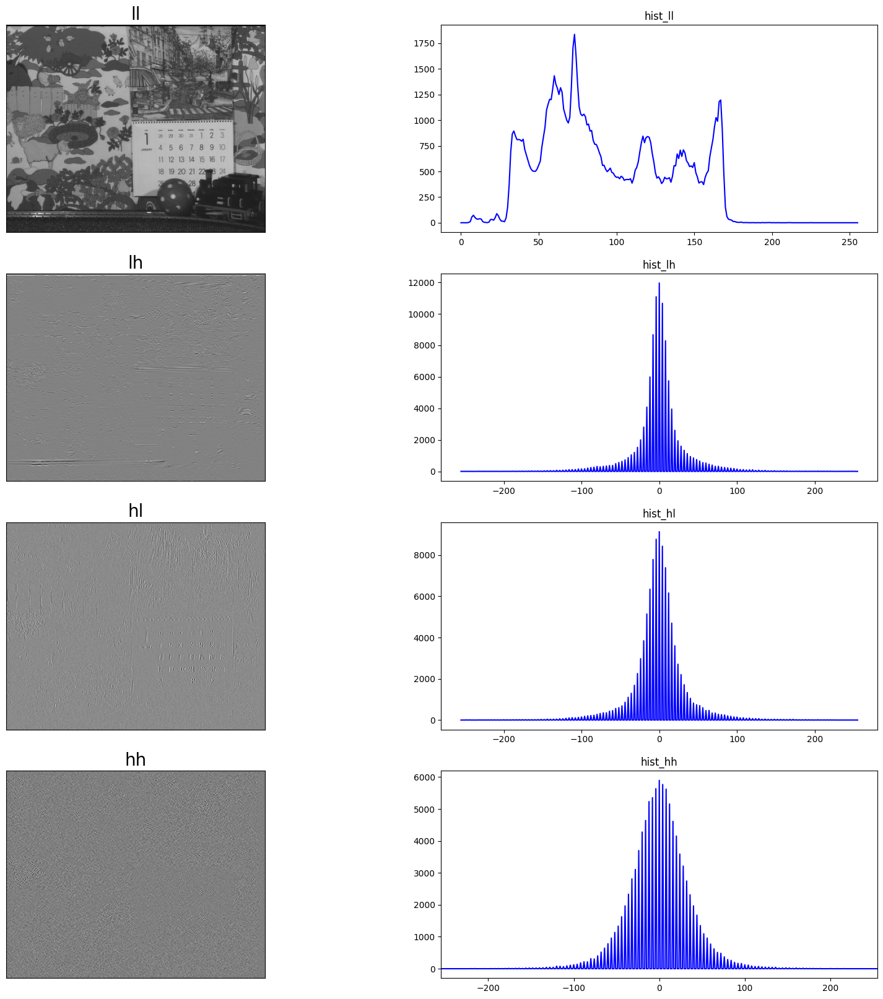

In [ ]:
# entropy dla obrazów po DWT
img = [(ll, "ll"), (lh, "lh"), (hl, "hl"), (hh, "hh")]

# histogramy
hist_ll = cv2.calcHist([ll], [0], None, [256], [0, 256]).flatten()
hist_lh = cv2.calcHist([(lh+255).astype(np.uint16)], [0], None, [511], [0, 511]).flatten() ### zmiana zakresu wartości i typu danych ze względu na cv2.calcHist() (jak wcześniej przy obrazach różnicowych)
hist_hl = cv2.calcHist([(hl+255).astype(np.uint16)], [0], None, [511], [0, 511]).flatten()
hist_hh = cv2.calcHist([(hh+255).astype(np.uint16)], [0], None, [511], [0, 511]).flatten()

histograms = [hist_ll, hist_lh, hist_hl, hist_hh]

# wyświtlenie obrazu po DWT
fig, axs = plt.subplots(4, 2, figsize=(20, 20))
for i in range(4):
    axs[i,0].imshow(img[i][0], cmap="gray")
    axs[i,0].set_title(img[i][1], fontsize=20)
    axs[i][0].set_xticks([])
    axs[i][0].set_yticks([])

# wyświetlenie histogramów
for i in range(4):
    if i == 0:
        axs[i, 1].plot(histograms[i], color="blue")
        plt.xlim([0, 255])
    else:
        axs[i, 1].plot(np.arange(-255, 256, 1), histograms[i], color="blue")
        plt.xlim([-255, 255])
    axs[i, 1].set_title(f"hist_{img[i][1]}")
plt.show()

In [ ]:
# Entropie obrazów
entropies = [calc_entropy(h) for h in histograms]

for i in range(4):
    print(f"Entropia dla obrazu {img[i][1]}: {entropies[i]}")

# Entropie obrazów różnicowych
print(f"Entropia dla obrazu różnicowego : {calc_entropy(hist_hdiff)}")
print(f"Entropia dla obrazu oryginalnego : {calc_entropy(histogram)}")

Entropia dla obrazu ll: 7.069824178732233
Entropia dla obrazu lh: 4.700300325348508
Entropia dla obrazu hl: 4.852126969170058
Entropia dla obrazu hh: 5.135756357005448
Entropia dla obrazu różnicowego : 5.352280771687219
Entropia dla obrazu oryginalnego : 7.078820897222613


#### Przepływność

In [ ]:
image = cv2.imread(mono, cv2.IMREAD_GRAYSCALE)

def calc_bitrate(img_name):
    file_stats = os.stat(img_name)
    file_size = file_stats.st_size  # Access the file size attribute
    bitrate = 8 * file_size / (image.shape[0] * image.shape[1])
    return bitrate



bitrate = calc_bitrate(mono)
print(f"Bitrate dla obrazu {mono}: {bitrate} bpp")
print(f"Entropia dla obrazu {mono}: {calc_entropy(histogram)}")
print(f"Entropia dla obrazu różnicowego : {calc_entropy(hist_hdiff)}")
for i in range(4):
    print(f"Entropia dla obrazu falkowego {img[i][1]}: {entropies[i]}")

Bitrate dla obrazu monochrome/mobile_mono.png: 5.378954475308642 bpp
Entropia dla obrazu monochrome/mobile_mono.png: 7.078820897222613
Entropia dla obrazu różnicowego : 5.352280771687219
Entropia dla obrazu falkowego ll: 7.069824178732233
Entropia dla obrazu falkowego lh: 4.700300325348508
Entropia dla obrazu falkowego hl: 4.852126969170058
Entropia dla obrazu falkowego hh: 5.135756357005448


# Obraz barwny

#### Liczenie entropi dla każdej barwy składowej

In [ ]:
# on już jest w RGB
image = load_img(color)

image_R = image[:, :, 0] # wybieramy czerwony kanał
image_G = image[:, :, 1] # wybieramy zielony kanał
image_B = image[:, :, 2] # wybieramy niebieski kanał

# obliczamy histogramy dla każdego kanału

hist_R = cv2.calcHist([image_R], [0], None, [256], [0, 256]).flatten()
hist_G = cv2.calcHist([image_G], [0], None, [256], [0, 256]).flatten()
hist_B = cv2.calcHist([image_B], [0], None, [256], [0, 256]).flatten()

histograms_rgb = [hist_R, hist_G, hist_B]

# obliczamy entropie dla każdego kanału
r_entropy = calc_entropy(hist_R)
g_entropy = calc_entropy(hist_G)
b_entropy = calc_entropy(hist_B)

entropies_rgb = [(r_entropy, "R"), (g_entropy, "G"), (b_entropy, "B")]

for i in range(3):
    print(f"Entropia dla kanału {entropies_rgb[i][1]}: {entropies_rgb[i][0]}")


Entropia dla kanału R: 7.078820897222613
Entropia dla kanału G: 7.189142757291847
Entropia dla kanału B: 6.748955090872187


#### Wykres obrazek i jego histogram

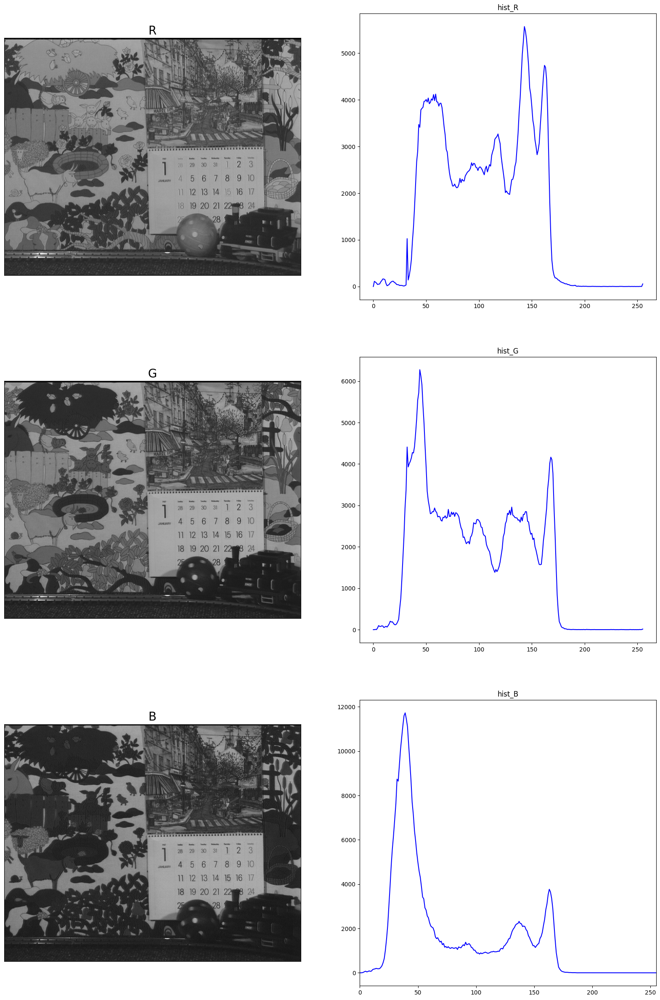

In [ ]:
fig, axs = plt.subplots(3, 2, figsize=(20, 30))
for i in range(3):
    axs[i, 0].imshow(image[:, :, i], cmap="gray")
    axs[i, 0].set_title(entropies_rgb[i][1], fontsize=20)
    axs[i, 0].set_xticks([])
    axs[i, 0].set_yticks([])

for i in range(3):
    axs[i, 1].plot(histograms_rgb[i], color="blue")
    plt.xlim([0, 255])
    axs[i, 1].set_title(f"hist_{entropies_rgb[i][1]}")

### Konwersja do YUV



In [ ]:
image_YUV = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)

hist_Y = cv2.calcHist([image_YUV[:, :, 0]], [0], None, [256], [0, 256]).flatten()
hist_U = cv2.calcHist([image_YUV[:, :, 1]], [0], None, [256], [0, 256]).flatten()
hist_V = cv2.calcHist([image_YUV[:, :, 2]], [0], None, [256], [0, 256]).flatten()
histograms_yuv = [hist_Y, hist_U, hist_V]

entropy_Y = calc_entropy(hist_Y)
entropy_U = calc_entropy(hist_U)
entropy_V = calc_entropy(hist_V)

entropies_yuv = [(entropy_Y,"Y"), (entropy_U, "U"), (entropy_V, "V")]

for i in range(3):
    print(f"Entropia dla kanału  {entropies_yuv[i][1]}: {entropies[i][0]}")

IndexError: invalid index to scalar variable.

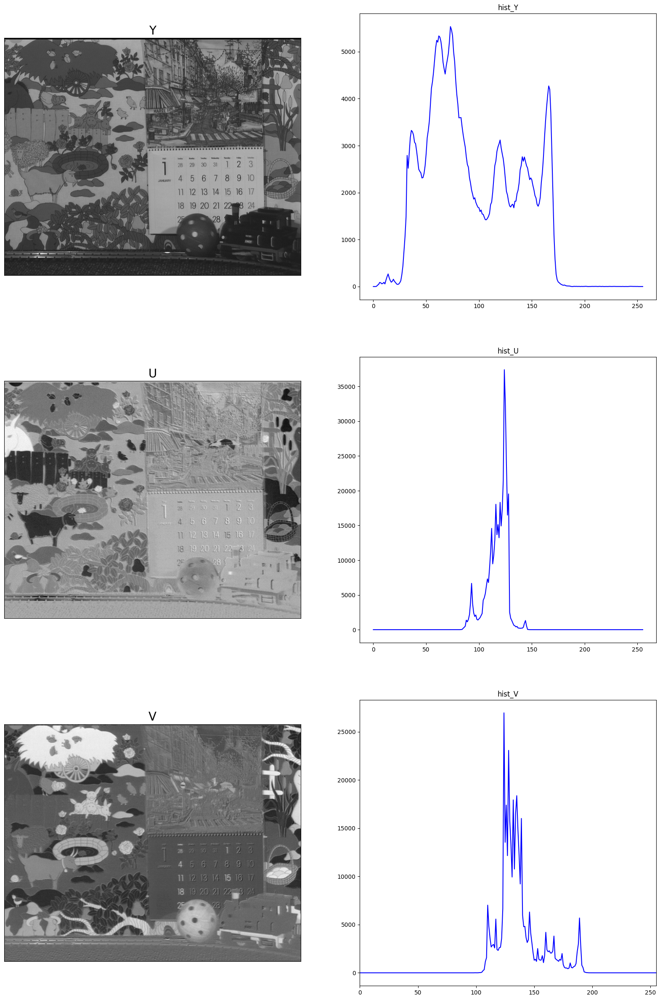

In [ ]:

fig, axs = plt.subplots(3, 2, figsize=(20, 30))
for i in range(3):
    axs[i, 0].imshow(image_YUV[:, :, i], cmap="gray")
    axs[i, 0].set_title(entropies_yuv[i][1], fontsize=20)
    axs[i, 0].set_xticks([])
    axs[i, 0].set_yticks([])

for i in range(3):
    axs[i, 1].plot(histograms_yuv[i], color="blue")
    plt.xlim([0, 255])
    axs[i, 1].set_title(f"hist_{entropies_yuv[i][1]}")

#### Charakterystyka R-D

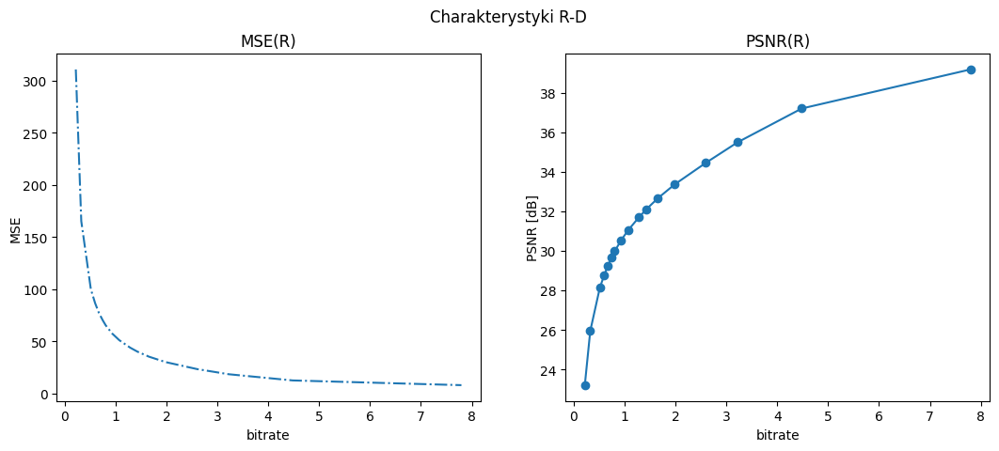

In [ ]:
def calc_mse_psnr(img1, img2):
    imax = 255.**2 ### maksymalna wartość sygnału -> 255

    mse = ((img1.astype(np.float64)-img2)**2).sum()/img1.size ###img1.size - liczba elementów w img1, ==img1.shape[0]*img1.shape[1] dla obrazów mono, ==img1.shape[0]*img1.shape[1]*img1.shape[2] dla obrazów barwnych
    psnr = 10.0*np.log10(imax/mse)
    return (mse, psnr)


xx = [] ### tablica na wartości osi X -> bitrate
ym = [] ### tablica na wartości osi Y dla MSE
yp = [] ### tablica na wartości osi Y dla PSNR

qualities = [5, 10, 20, 25, 30, 35, 40, 50, 60, 70, 75, 80, 85, 90, 93, 96, 100]

color_img = load_img(color)

for quality in qualities:
    out_file = f"jpeg/jpeg_q{quality}.jpg"
    cv2.imwrite(out_file, color_img, [cv2.IMWRITE_JPEG_QUALITY, quality])

    image_compressed = cv2.imread(out_file, cv2.IMREAD_COLOR)
    img_bitrate = 8*os.stat(out_file).st_size/(image_compressed.shape[0]*image_compressed.shape[1])
    mse, psnr = calc_mse_psnr(color_img, image_compressed)

    xx.append(img_bitrate)
    ym.append(mse)
    yp.append(psnr)

fig = plt.figure()
fig.set_figwidth(fig.get_figwidth()*2)
plt.suptitle("Charakterystyki R-D")
plt.subplot(1, 2, 1)
plt.plot(xx, ym, "-.")
plt.title("MSE(R)")
plt.xlabel("bitrate")
plt.ylabel("MSE", labelpad=0)
plt.subplot(1, 2, 2)
plt.plot(xx, yp, "-o")
plt.title("PSNR(R)")
plt.xlabel("bitrate")
plt.ylabel("PSNR [dB]", labelpad=0)
plt.show()

#### Ocena wykresów


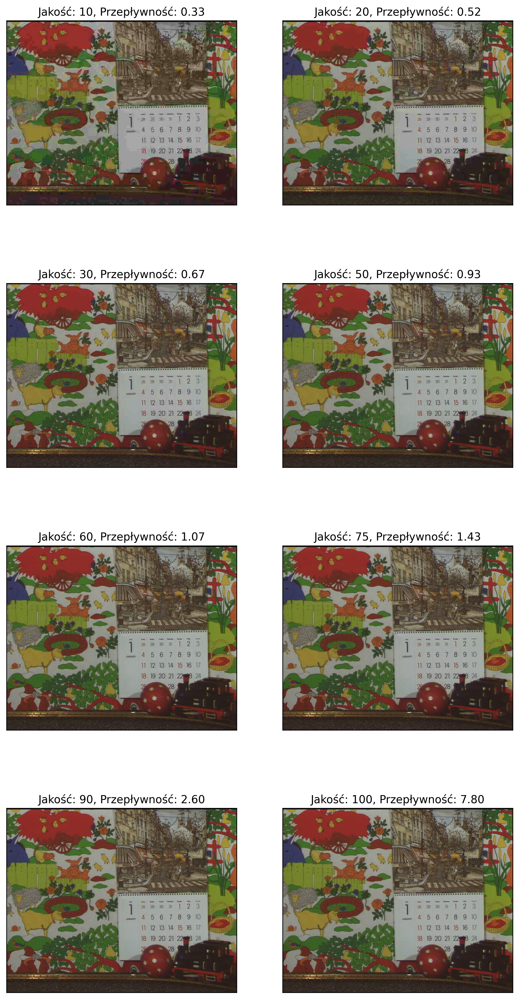

In [ ]:
rated_imgs = [10, 20, 30, 50, 60, 75, 90, 100]

fig, axs = plt.subplots(len(rated_imgs)//2, 2, figsize=(10, 20))

for idx, quality in enumerate(rated_imgs):
    src = f"jpeg/jpeg_q{quality}.jpg"
    img = cv2.imread(src, cv2.IMREAD_COLOR)
    img_bitrate = 8*os.stat(src).st_size/(img.shape[0]*img.shape[1])


    cur_axis = axs[idx//2][idx%2]
    cur_axis.imshow(img)
    cur_axis.set_title(f"Jakość: {quality}, Przepływność: {img_bitrate:.2f}")
    cur_axis.set_xticks([])
    cur_axis.set_yticks([])

plt.gcf().set_dpi(250)
plt.show()

#### Przepływność dla obrazu jpg dla różnych jakości

In [ ]:
for quality in qualities:
    out_file = f"jpeg/jpeg_q{quality}.jpg"
    cv2.imwrite(out_file, color_img, [cv2.IMWRITE_JPEG_QUALITY, quality])

    image_compressed = cv2.imread(out_file, cv2.IMREAD_COLOR)
    img_bitrate = 8*os.stat(out_file).st_size/(image_compressed.shape[0]*image_compressed.shape[1])
    print(f"Przepływność dla obrazu {out_file}: {img_bitrate} bpp")

Przepływność dla obrazu jpeg/jpeg_q5.jpg: 0.2199266975308642 bpp
Przepływność dla obrazu jpeg/jpeg_q10.jpg: 0.3272569444444444 bpp
Przepływność dla obrazu jpeg/jpeg_q20.jpg: 0.5152199074074074 bpp
Przepływność dla obrazu jpeg/jpeg_q25.jpg: 0.5994405864197531 bpp
Przepływność dla obrazu jpeg/jpeg_q30.jpg: 0.674903549382716 bpp
Przepływność dla obrazu jpeg/jpeg_q35.jpg: 0.7487268518518518 bpp
Przepływność dla obrazu jpeg/jpeg_q40.jpg: 0.8077739197530864 bpp
Przepływność dla obrazu jpeg/jpeg_q50.jpg: 0.9344907407407408 bpp
Przepływność dla obrazu jpeg/jpeg_q60.jpg: 1.071855709876543 bpp
Przepływność dla obrazu jpeg/jpeg_q70.jpg: 1.2867476851851851 bpp
Przepływność dla obrazu jpeg/jpeg_q75.jpg: 1.431230709876543 bpp
Przepływność dla obrazu jpeg/jpeg_q80.jpg: 1.6563850308641976 bpp
Przepływność dla obrazu jpeg/jpeg_q85.jpg: 1.9847029320987655 bpp
Przepływność dla obrazu jpeg/jpeg_q90.jpg: 2.598688271604938 bpp
Przepływność dla obrazu jpeg/jpeg_q93.jpg: 3.2237654320987654 bpp
Przepływność dl

#### Przepływowość dla png

In [ ]:
bitrate = calc_bitrate(color)
print(f"Przepływność dla obrazu {color}: {bitrate} bpp")

Przepływność dla obrazu color/mobile_col.png: 15.141415895061728 bpp
